<a href="https://colab.research.google.com/github/lluk4z/Fazedor-de-arte/blob/master/Fazedor_de_arte_1_0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install diffusers

In [ ]:
!pip install transformers accelerate

In [ ]:
!pip install pixelsort

In [ ]:
!pip3 install sox
!git clone https://github.com/Roachbones/sockbend.git

In [ ]:
!pip install glitch-this

In [29]:
#@title importar bibliotecas
from diffusers import StableDiffusionPipeline
from PIL import Image
import torch


import cv2
from PIL import Image, ImageDraw

import matplotlib
import matplotlib.pyplot as plt

import os
import tensorflow as tf
# Load compressed models from tensorflow_hub
os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'

import IPython.display as display

import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12, 12)
mpl.rcParams['axes.grid'] = False

import numpy as np
import PIL.Image
import time
import functools

from google.colab import files
import io

import matplotlib as mpl

import IPython.display as display

from pixelsort import pixelsort

from glitch_this import ImageGlitcher
import random

In [ ]:
CUDA_VISIBLE_DEVICES=1

Alterar ambiente de execução para GPU

In [ ]:
#@title Iniciar Stable Diffusion
model_id = "dreamlike-art/dreamlike-diffusion-1.0"

pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)

pipe = pipe.to("cuda")

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

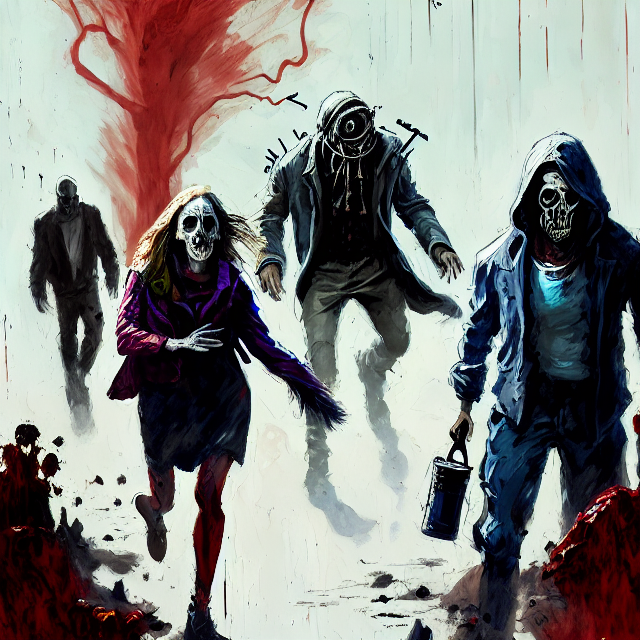

In [ ]:
#@title escreva o texto para gerar a imagem (de preferência em inglês)
prompt = "expressionist painting of people in a post-apocalyptic scenario dying in a horror film and ghosts flying around"#@param {type: "string"}

image = pipe(prompt).images[0]

image

In [ ]:
image.save('img_ai.png')

## Style Transfer

Carregar imagem de conteúdo

In [7]:
uploaded = files.upload()


img_conteudo = ''
for fn in uploaded.keys():
  img_conteudo = fn
  print(img_conteudo)

Saving abaporu_tarsila-do-amaral.png to abaporu_tarsila-do-amaral.png
abaporu_tarsila-do-amaral.png


Carregar imagem de estilo

In [ ]:
uploaded_style = files.upload()

img_estilo = ''
for fn in uploaded_style.keys():
  img_estilo = fn
  print(img_estilo)

Saving mbv.jpg to mbv.jpg
mbv.jpg


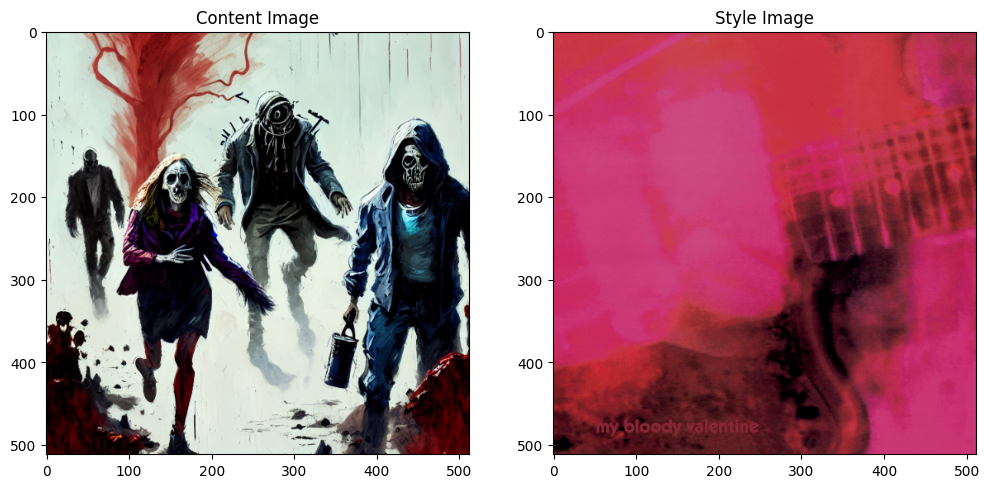

In [ ]:
#@title Rodar inicio da tranferência de estilo

def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)


container_img_ia = True #@param {type:"boolean"}
estilo_img_ia = False #@param {type:"boolean"}

if container_img_ia == True:
  content_path = f'/content/img_ai.png'
else:
  content_path = f'/content/{img_conteudo}'


if estilo_img_ia == True:
  style_path = f'/content/img_ai.png'
else:
  style_path = f'/content/{img_estilo}'

#content_path = f'/content/{img_conteudo}'
#style_path = f'/content/{img_estilo}'

def load_img(path_to_img):
  max_dim = 512
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img


def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)


content_image = load_img(content_path)
style_image = load_img(style_path)


plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

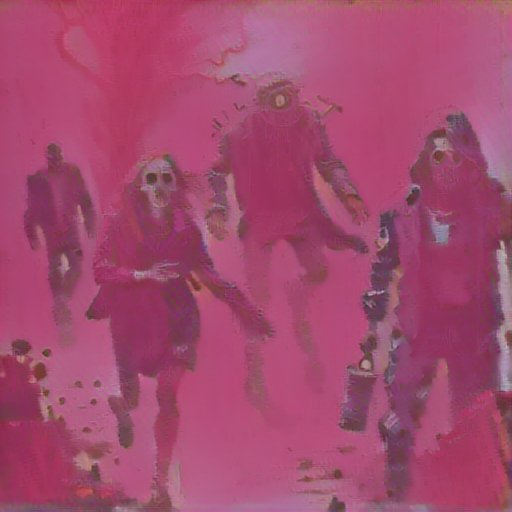

In [ ]:
#@title Realizar transferência de estilo
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

In [ ]:
im_result = tensor_to_image(stylized_image)
im_result.save('image_styled.png')

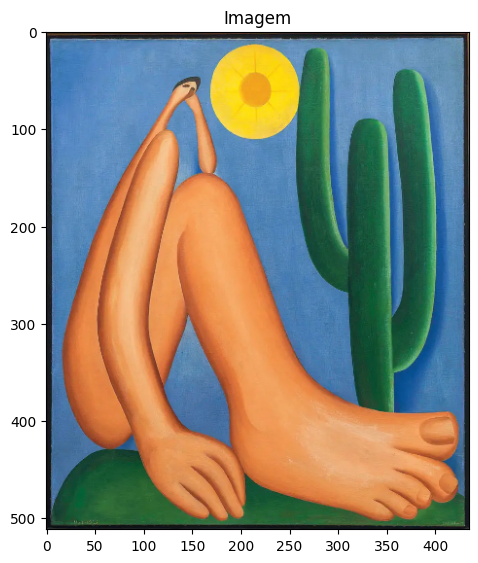

In [21]:
#@title Pixelsort
container_simples = img_conteudo
imagem_IA = 'img_ai.png'
imagem_style_transfer = 'image_styled.png'

imagem = 'container_simples' #@param ['container_simples', 'imagem_IA', 'imagem_style_transfer']

if imagem == 'container_simples':
  in_file = f"/content/{img_conteudo}"

if imagem == 'imagem_IA':
  in_file = f"/content/{imagem_IA}"

if imagem == 'imagem_style_transfer':
  in_file = f"/content/{imagem_style_transfer}"

#in_file = f"/content/{imagem}"
out_file = "/content/demo_1.png"

def load_img(path_to_img):
  max_dim = 512
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)


imagem_conteudo = load_img(in_file)

plt.subplot(1, 2, 1)
imshow(imagem_conteudo, 'Imagem')


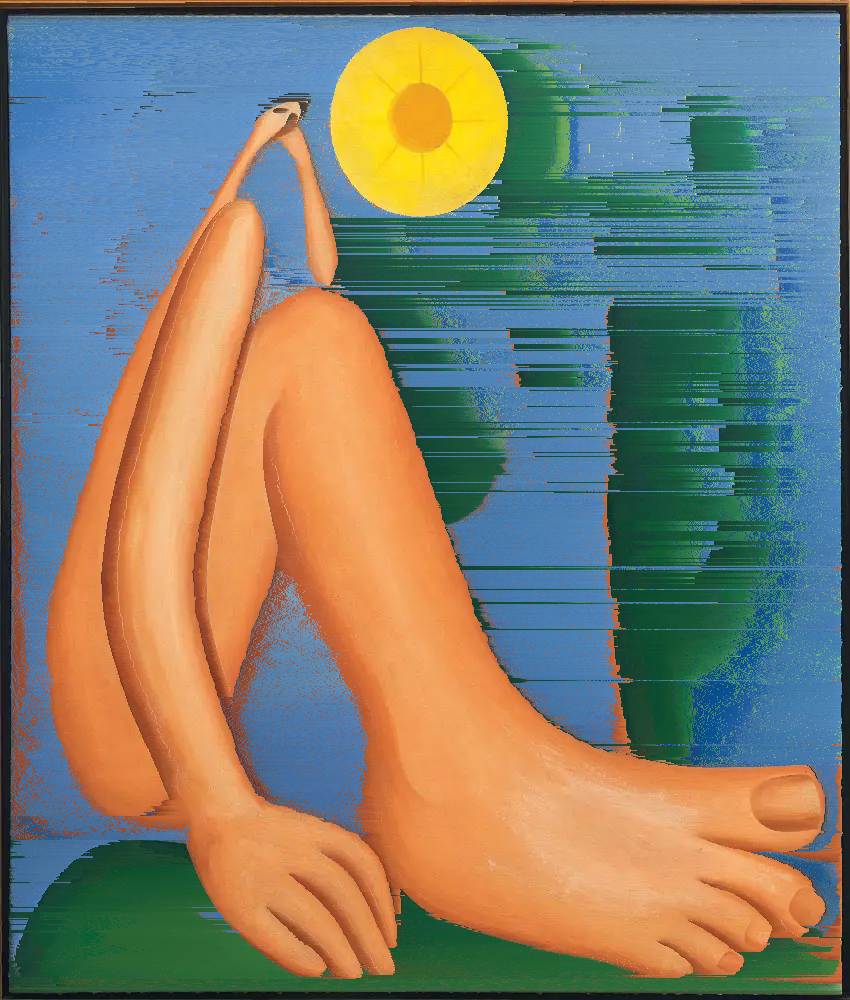

In [30]:
#@title pixelsort default

img = Image.open(in_file)
new_img = pixelsort(img)
new_img.save(out_file)

new_img

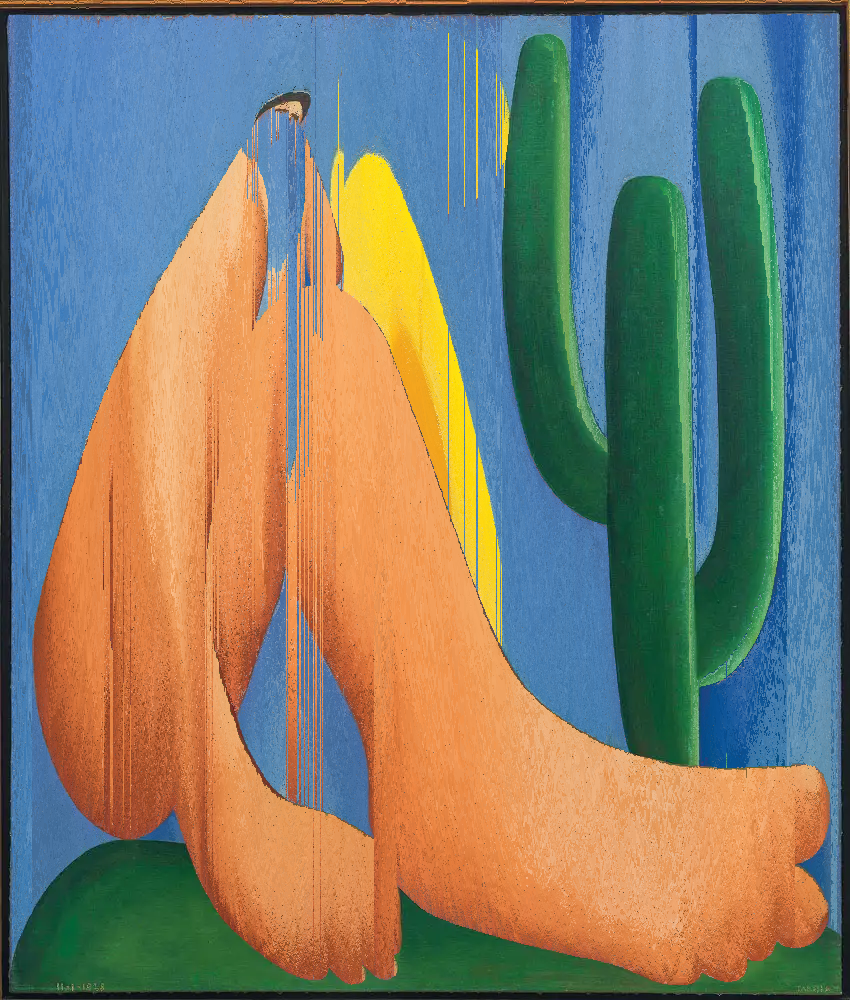

In [24]:
#@title Pixelsort com parâmetros

angle =  270#@param {type: "number"}
lower_threshold =  0.5#@param {type: "number"}
upper_threshold =  1.0#@param {type: "number"}
sorting_function = "hue" #@param ['hue', 'lightness', 'saturation', 'intensity', 'minimum']

img = Image.open(in_file)
new_img = pixelsort(img,angle=angle,lower_threshold=lower_threshold,upper_threshold=upper_threshold,sorting_function=sorting_function)
new_img.save(out_file)

new_img

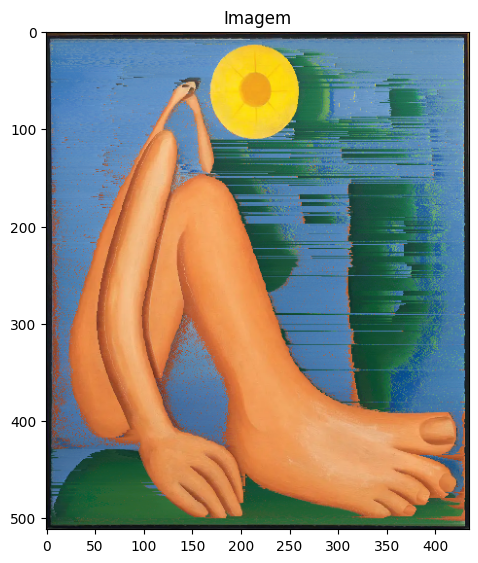

In [38]:
#@title Databending

glitcher = ImageGlitcher()

container_simples = img_conteudo
imagem_IA = 'img_ai.png'
imagem_style_transfer = 'image_styled.png'
imagem_pixelsort = 'demo_1.png'

imagem = 'imagem_pixelsort' #@param ['container_simples', 'imagem_IA', 'imagem_style_transfer', 'imagem_pixelsort']

if imagem == 'container_simples':
  in_file = f"/content/{img_conteudo}"

if imagem == 'imagem_IA':
  in_file = f"/content/{imagem_IA}"

if imagem == 'imagem_style_transfer':
  in_file = f"/content/{imagem_style_transfer}"

if imagem == 'imagem_pixelsort':
  in_file = f"/content/{imagem_pixelsort}"

#in_file = f"/content/{imagem}"
out_file = "/content/glitch_img.png"


def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

def load_img(path_to_img):
  max_dim = 512
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)


imagem_conteudo = load_img(in_file)


plt.subplot(1, 2, 1)
imshow(imagem_conteudo, 'Imagem')

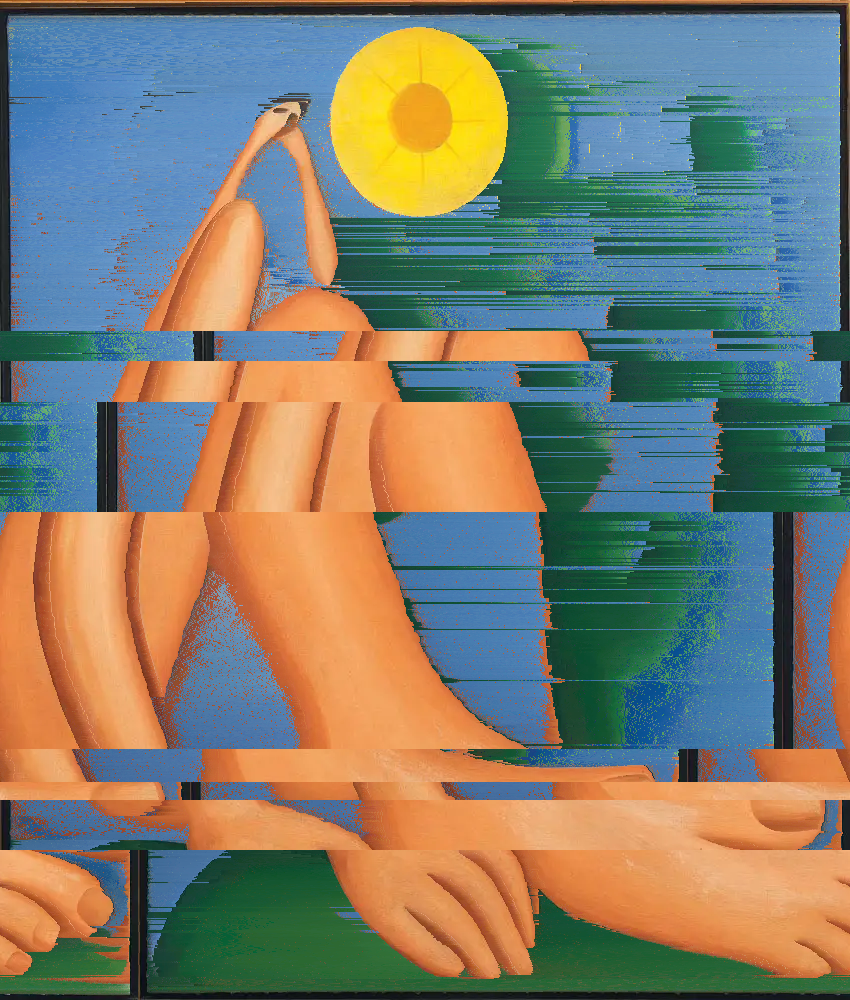

In [41]:
img = Image.open(in_file)

Quantidade_glitch = 5 #@param {type: "number"}
color_offset = False #@param {type:"boolean"}
seed = 331360 #@param {type: "slider", min: 0, max: 2000000, step: 1}

glitch_img = glitcher.glitch_image(img, Quantidade_glitch, color_offset=color_offset, seed = random.seed(random.randint(1, 2000000)))

glitch_img.save('glitch_img.png')

glitch_img

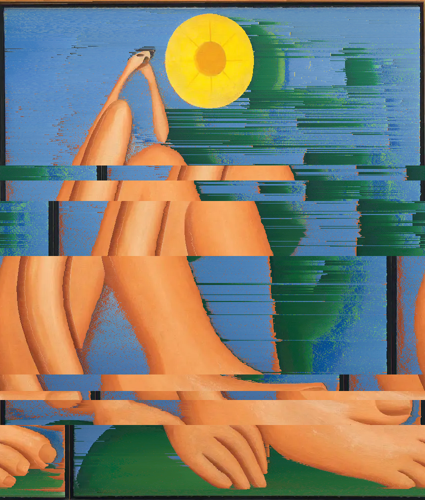

In [42]:
#@title Deep Dream

container_simples = img_conteudo
imagem_IA = 'img_ai.png'
imagem_style_transfer = 'image_styled.png'
imagem_pixelsort = 'demo_1.png'
imagem_glitch = 'glitch_img.png'

imagem = 'imagem_glitch' #@param ['container_simples', 'imagem_IA', 'imagem_style_transfer', 'imagem_pixelsort', 'imagem_glitch']

if imagem == 'container_simples':
  url = f"/content/{img_conteudo}"

if imagem == 'imagem_IA':
  url = f"/content/{imagem_IA}"

if imagem == 'imagem_style_transfer':
  url = f"/content/{imagem_style_transfer}"

if imagem == 'imagem_pixelsort':
  url = f"/content/{imagem_pixelsort}"

if imagem == 'imagem_glitch':
  url = f"/content/{imagem_glitch}"

#url = '/content/WhatsApp Image 2023-09-18 at 15.08.51.jpeg'

# Download an image and read it into a NumPy array.
def download(url, max_dim=None):
  name = url.split('/')[-1]
  image_path = url
  img = PIL.Image.open(image_path)
  if max_dim:
    img.thumbnail((max_dim, max_dim))
  return np.array(img)

# Normalize an image
def deprocess(img):
  img = 255*(img + 1.0)/2.0
  return tf.cast(img, tf.uint8)

# Display an image
def show(img):
  display.display(PIL.Image.fromarray(np.array(img)))

original_img = download(url, max_dim=500)
show(original_img)
display.display(display.HTML('Image cc-by: <a "href=https://commons.wikimedia.org/wiki/File:Felis_catus-cat_on_snow.jpg">Von.grzanka</a>'))

In [ ]:
#@title Camadas
#As camadas podem ir de 0 à 10. Escolha com sabedoria


camada01 = 'mixed5' #@param ['mixed0', 'mixed1', 'mixed2', 'mixed3', 'mixed4', 'mixed5', 'mixed6', 'mixed7', 'mixed8', 'mixed9', 'mixed10']
camada02 = 'mixed8' #@param ['mixed0', 'mixed1', 'mixed2', 'mixed3', 'mixed4', 'mixed5', 'mixed6', 'mixed7', 'mixed8', 'mixed9', 'mixed10']
camada03 = 'mixed10' #@param ['mixed0', 'mixed1', 'mixed2', 'mixed3', 'mixed4', 'mixed5', 'mixed6', 'mixed7', 'mixed8', 'mixed9', 'mixed10']

names = [camada01, camada02, camada03]
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
layers = [base_model.get_layer(name).output for name in names]
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

In [ ]:
#@title Deep Dream 01

#base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
# Maximize the activations of these layers



# Create the feature extraction model
#dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)


def calc_loss(img, model):
  # Pass forward the image through the model to retrieve the activations.
  # Converts the image into a batch of size 1.
  img_batch = tf.expand_dims(img, axis=0)
  layer_activations = model(img_batch)
  if len(layer_activations) == 1:
    layer_activations = [layer_activations]

  losses = []
  for act in layer_activations:
    loss = tf.math.reduce_mean(act)
    losses.append(loss)

  return  tf.reduce_sum(losses)


class DeepDream(tf.Module):
  def __init__(self, model):
    self.model = model

  @tf.function(
      input_signature=(
        tf.TensorSpec(shape=[None,None,3], dtype=tf.float32),
        tf.TensorSpec(shape=[], dtype=tf.int32),
        tf.TensorSpec(shape=[], dtype=tf.float32),)
  )
  def __call__(self, img, steps, step_size):
      print("Tracing")
      loss = tf.constant(0.0)
      for n in tf.range(steps):
        with tf.GradientTape() as tape:
          # This needs gradients relative to `img`
          # `GradientTape` only watches `tf.Variable`s by default
          tape.watch(img)
          loss = calc_loss(img, self.model)

        # Calculate the gradient of the loss with respect to the pixels of the input image.
        gradients = tape.gradient(loss, img)

        # Normalize the gradients.
        gradients /= tf.math.reduce_std(gradients) + 1e-8

        # In gradient ascent, the "loss" is maximized so that the input image increasingly "excites" the layers.
        # You can update the image by directly adding the gradients (because they're the same shape!)
        img = img + gradients*step_size
        img = tf.clip_by_value(img, -1, 1)

      return loss, img


deepdream = DeepDream(dream_model)

def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.inception_v3.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))


  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result


dream_img = run_deep_dream_simple(img=original_img,
                                  steps=100, step_size=0.01)

In [ ]:
#@title Deep Dream 02

import time
start = time.time()

OCTAVE_SCALE = 1.30

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)


def random_roll(img, maxroll):
  # Randomly shift the image to avoid tiled boundaries.
  shift = tf.random.uniform(shape=[2], minval=-maxroll, maxval=maxroll, dtype=tf.int32)
  img_rolled = tf.roll(img, shift=shift, axis=[0,1])
  return shift, img_rolled


shift, img_rolled = random_roll(np.array(original_img), 512)
show(img_rolled)


class TiledGradients(tf.Module):
  def __init__(self, model):
    self.model = model

  @tf.function(
      input_signature=(
        tf.TensorSpec(shape=[None,None,3], dtype=tf.float32),
        tf.TensorSpec(shape=[2], dtype=tf.int32),
        tf.TensorSpec(shape=[], dtype=tf.int32),)
  )
  def __call__(self, img, img_size, tile_size=512):
    shift, img_rolled = random_roll(img, tile_size)

    # Initialize the image gradients to zero.
    gradients = tf.zeros_like(img_rolled)

    # Skip the last tile, unless there's only one tile.
    xs = tf.range(0, img_size[1], tile_size)[:-1]
    if not tf.cast(len(xs), bool):
      xs = tf.constant([0])
    ys = tf.range(0, img_size[0], tile_size)[:-1]
    if not tf.cast(len(ys), bool):
      ys = tf.constant([0])

    for x in xs:
      for y in ys:
        # Calculate the gradients for this tile.
        with tf.GradientTape() as tape:
          # This needs gradients relative to `img_rolled`.
          # `GradientTape` only watches `tf.Variable`s by default.
          tape.watch(img_rolled)

          # Extract a tile out of the image.
          img_tile = img_rolled[y:y+tile_size, x:x+tile_size]
          loss = calc_loss(img_tile, self.model)

        # Update the image gradients for this tile.
        gradients = gradients + tape.gradient(loss, img_rolled)

    # Undo the random shift applied to the image and its gradients.
    gradients = tf.roll(gradients, shift=-shift, axis=[0,1])

    # Normalize the gradients.
    gradients /= tf.math.reduce_std(gradients) + 1e-8

    return gradients



get_tiled_gradients = TiledGradients(dream_model)

steps_per_octave =  100#@param {type: "number"}

step_size =  0.01#@param {type: "number"}

octaves_inicio =  -2#@param {type: "number"}

octaves_fim =  3#@param {type: "number"}

octave_scale =  1.3#@param {type: "number"}

def run_deep_dream_with_octaves(img, steps_per_octave=steps_per_octave, step_size=step_size,
                                octaves=range(octaves_inicio,octaves_fim), octave_scale=octave_scale):
  base_shape = tf.shape(img)
  img = tf.keras.utils.img_to_array(img)
  img = tf.keras.applications.inception_v3.preprocess_input(img)

  initial_shape = img.shape[:-1]
  img = tf.image.resize(img, initial_shape)
  for octave in octaves:
    # Scale the image based on the octave
    new_size = tf.cast(tf.convert_to_tensor(base_shape[:-1]), tf.float32)*(octave_scale**octave)
    new_size = tf.cast(new_size, tf.int32)
    img = tf.image.resize(img, new_size)

    for step in range(steps_per_octave):
      gradients = get_tiled_gradients(img, new_size)
      img = img + gradients*step_size
      img = tf.clip_by_value(img, -1, 1)

      if step % 10 == 0:
        display.clear_output(wait=True)
        show(deprocess(img))
        print ("Octave {}, Step {}".format(octave, step))

  result = deprocess(img)
  return result


img = run_deep_dream_with_octaves(img=original_img, step_size=0.01)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

# Extra: Moldura da imagem

In [43]:
img2 = Image.open(r"/content/glitch_img.png")

In [44]:
w, h = img2.size

width, height = w+100, h+100

In [ ]:
cores = []
cnt = 0
for cor_rgb in img2.getdata():
    if cor_rgb not in cores:
        cor_rgb = cor_rgb[ : 3 ] + cor_rgb[3+1 : ]
        cores.append(cor_rgb)
    if cnt == 10000:
      break

    cnt = cnt + 1

In [64]:
img = np.zeros((height, width, 3), dtype=np.uint8)



img[:] = (35, 29, 43)

#img[int(height*0.5):height, 3:width] = (35,5,43)



#img[int(height*0.90):height, -11:width] = (10,50,20)
#img[0:width, int(height*0.9):height] = (50,60,100)

#img[int(height*0.90):height, 0:width] = (70,50,105)


number_of_squares = random.randint(10, 550)


for i in range(number_of_squares):
    rectangle_x = random.randint(0, width)
    rectangle_y = random.randint(0, height)

    img[int(rectangle_x):width, int(rectangle_y):height] = (cores[random.randint(0, cnt-1)])


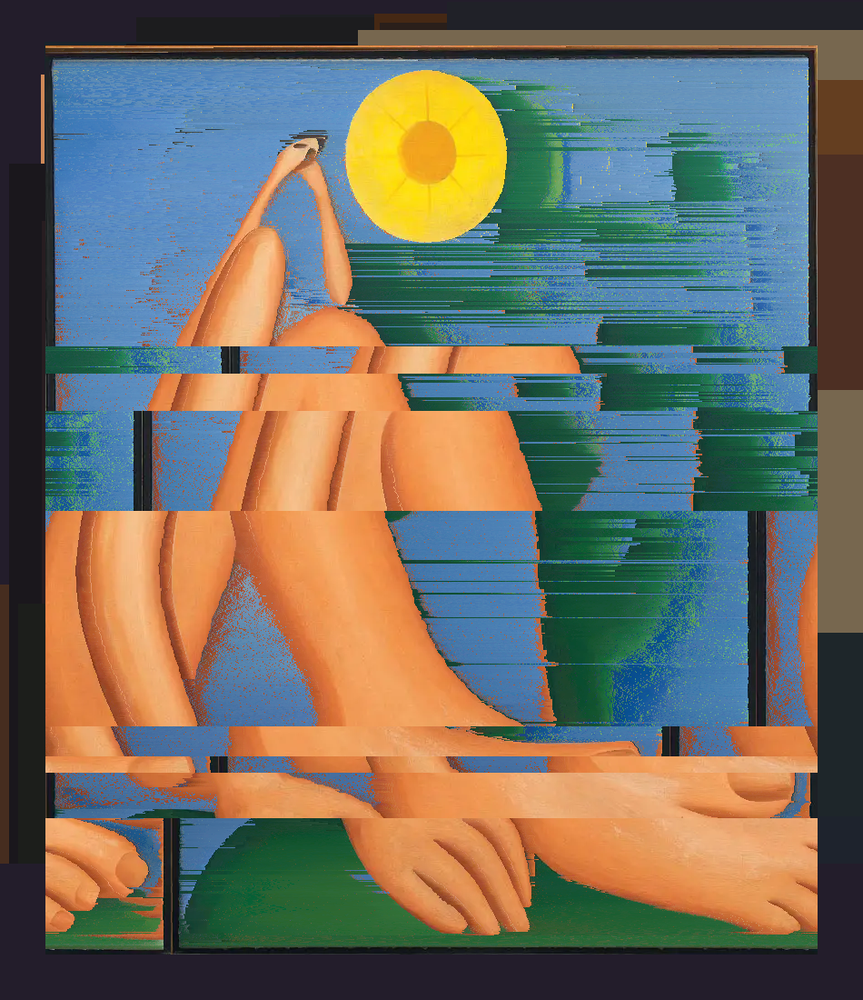

In [65]:
Image.fromarray(img).save("my_img.png")
img1 = Image.open(r"/content/my_img.png")

img1.paste(img2, (50,50))
img1.save("img_com_moldura.png")
img1